In [1]:
import sqlite3
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import os

import datetime as dt
import squarify
import numpy as np

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colors as mcolors
from tabulate import tabulate
from collections import Counter
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score
from sklearn.ensemble import IsolationForest
from scipy.stats import linregress
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [2]:
conn = sqlite3.connect('D:\\project\\dataset\\brazil_ecommerce.db')

#lấy dữ liệu thành các df
customers = pd.read_sql_query("SELECT * FROM customers", conn)
geolocation = pd.read_sql_query('select * from geolocation', conn)
order_items = pd.read_sql_query('select * from order_items', conn)
order_payments = pd.read_sql_query('select * from order_payments', conn)
order_reviews = pd.read_sql_query('select * from order_reviews', conn)
orders = pd.read_sql_query('select * from orders', conn)
products = pd.read_sql_query('select * from products', conn)
sellers = pd.read_sql_query('select * from sellers', conn)
products_category_translation = pd.read_sql_query('select * from product_category_name_translation', conn)
# Đóng kết nối
conn.close()


# Check null values and duplicate rows

In [3]:
datasets = [customers, geolocation, order_items, order_payments, order_reviews, orders, products, sellers, products_category_translation]
titles = ["customers", "geolocation", "items", "payments", "reviews", "orders", "products", "sellers", "category_translation"]

data_summary = pd.DataFrame({},)
data_summary['datasets']= titles
data_summary['columns'] = [', '.join([col for col, null in data.isnull().sum().items() ]) for data in datasets]
data_summary['total_rows']= [data.shape[0] for data in datasets]
data_summary['total_cols']= [data.shape[1] for data in datasets]
data_summary['total_duplicate']= [len(data[data.duplicated()]) for data in datasets]
data_summary['total_null']= [data.isnull().sum().sum() for data in datasets]
data_summary['null_cols'] = [', '.join([col for col, null in data.isnull().sum().items() if null > 0]) for data in datasets]
data_summary.style.background_gradient(cmap='YlGnBu')

,datasets,columns,total_rows,total_cols,total_duplicate,total_null,null_cols
0,customers,"customer_id, customer_unique_id, geolocation_zip_code_prefix, customer_city, customer_state",99441,5,0,0,
1,geolocation,"geolocation_zip_code_prefix, geolocation_lat, geolocation_lng, geolocation_city, geolocation_state",1000163,5,261831,0,
2,items,"order_id, order_item_id, product_id, seller_id, shipping_limit_date, price, freight_value",112650,7,0,0,
3,payments,"payment_id, order_id, payment_sequential, payment_type, payment_installments, payment_value",103886,6,0,0,
4,reviews,"review_id, order_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp",97621,7,0,143429,"review_comment_title, review_comment_message"
5,orders,"order_id, customer_id, order_status, order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date",99441,8,0,4908,"order_approved_at, order_delivered_carrier_date, order_delivered_customer_date"
6,products,"product_id, product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm",32951,9,0,2448,"product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm"
7,sellers,"seller_id, geolocation_zip_code_prefix, seller_city, seller_state",3095,4,0,0,
8,category_translation,"product_category_name, product_category_name_english",71,2,0,0,


There are null values in 3 tables:
- reviews
- orders
- products

**Reviews table**

In [4]:
order_reviews.isnull().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       86150
review_comment_message     57279
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [5]:
# drop the review_comment_title column
order_reviews.drop(['review_comment_title'], axis=1, inplace=True)
# replace missing review messages with string 'NONE'
order_reviews['review_comment_message'] = order_reviews['review_comment_message'].fillna('NONE')
# check for missing values
order_reviews.isnull().sum()

review_id                  0
order_id                   0
review_score               0
review_comment_message     0
review_creation_date       0
review_answer_timestamp    0
dtype: int64

**Orders table**

In [6]:
orders.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

All the missing values are timestamp values, these values are:
- approve timestamp
- carrier delivery timestamp
- customer delivery timestamp

Order approval follows the order purchase and usually happens within a short interval, hence missing approval timestamp can be substituted with the purchase timestamp

As per observation the carrier delivery timestamp is often same as the order approval date, so we can substitute the carrier delivery date with the approval date

Also it is seen that estimated delivery date is often later than the actual customer delivery date so we can easily substitute the missing customer delivery date with the estimated delivery date

In [7]:
orders["order_approved_at"] = orders["order_approved_at"].fillna(orders["order_purchase_timestamp"])
orders["order_delivered_carrier_date"] = orders["order_delivered_carrier_date"].fillna(orders["order_approved_at"])
orders["order_delivered_customer_date"] = orders["order_delivered_customer_date"].fillna(orders["order_estimated_delivery_date"])
orders.isnull().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64

**Products table**

In [8]:
products.isnull().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

Product name, description and category is missing for more than 600 products, the size details of 2 products is missing we can impute dimension details with the median value or we can drop those 2 rows

In [9]:
products[products['product_weight_g'].isnull()]


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
products['product_description_lenght'].fillna(products['product_description_lenght'].median,inplace=True)
products['product_photos_qty'].fillna(products['product_photos_qty'].median(), inplace=True)
products['product_weight_g'].fillna(products['product_weight_g'].median(), inplace=True)
products['product_length_cm'].fillna(products['product_length_cm'].median(), inplace=True)
products['product_height_cm'].fillna(products['product_height_cm'].median(), inplace=True)
products['product_width_cm'].fillna(products['product_width_cm'].median(), inplace=True)
products.isnull().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght      0
product_photos_qty              0
product_weight_g                0
product_length_cm               0
product_height_cm               0
product_width_cm                0
dtype: int64

In [11]:
# check again
data_summary = pd.DataFrame({},)
data_summary['datasets']= titles
data_summary['columns'] = [', '.join([col for col, null in data.isnull().sum().items() ]) for data in datasets]
data_summary['total_rows']= [data.shape[0] for data in datasets]
data_summary['total_cols']= [data.shape[1] for data in datasets]
data_summary['total_duplicate']= [len(data[data.duplicated()]) for data in datasets]
data_summary['total_null']= [data.isnull().sum().sum() for data in datasets]
data_summary['null_cols'] = [', '.join([col for col, null in data.isnull().sum().items() if null > 0]) for data in datasets]
data_summary.style.background_gradient(cmap='YlGnBu')

,datasets,columns,total_rows,total_cols,total_duplicate,total_null,null_cols
0,customers,"customer_id, customer_unique_id, geolocation_zip_code_prefix, customer_city, customer_state",99441,5,0,0,
1,geolocation,"geolocation_zip_code_prefix, geolocation_lat, geolocation_lng, geolocation_city, geolocation_state",1000163,5,261831,0,
2,items,"order_id, order_item_id, product_id, seller_id, shipping_limit_date, price, freight_value",112650,7,0,0,
3,payments,"payment_id, order_id, payment_sequential, payment_type, payment_installments, payment_value",103886,6,0,0,
4,reviews,"review_id, order_id, review_score, review_comment_message, review_creation_date, review_answer_timestamp",97621,6,0,0,
5,orders,"order_id, customer_id, order_status, order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date",99441,8,0,0,
6,products,"product_id, product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm",32951,9,0,1220,"product_category_name, product_name_lenght"
7,sellers,"seller_id, geolocation_zip_code_prefix, seller_city, seller_state",3095,4,0,0,
8,category_translation,"product_category_name, product_category_name_english",71,2,0,0,


In [12]:
for column in geolocation.columns:
    if geolocation[column].duplicated().any():
        print(column)

geolocation_zip_code_prefix
geolocation_lat
geolocation_lng
geolocation_city
geolocation_state


Bảng geolocation không thể loại bỏ các giá trị duplicate được vì các giá trị latitude và longtitude có thể trùng zip code prefix nên ta giữ nguyên

# Datatype Normalizing

In [11]:
# merge data
merged_df= pd.merge(customers, orders, on="customer_id")
merged_df= merged_df.merge(order_reviews, on="order_id")
merged_df= merged_df.merge(order_items, on="order_id")
merged_df= merged_df.merge(products, on="product_id")
merged_df= merged_df.merge(order_payments, on="order_id")
merged_df= merged_df.merge(sellers, on='seller_id')
merged_df= merged_df.merge(products_category_translation, on='product_category_name')
merged_df.shape

(113742, 40)

In [18]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113742 entries, 0 to 113741
Data columns (total 40 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    113742 non-null  object 
 1   customer_unique_id             113742 non-null  object 
 2   geolocation_zip_code_prefix_x  113742 non-null  int64  
 3   customer_city                  113742 non-null  object 
 4   customer_state                 113742 non-null  object 
 5   order_id                       113742 non-null  object 
 6   order_status                   113742 non-null  object 
 7   order_purchase_timestamp       113742 non-null  object 
 8   order_approved_at              113742 non-null  object 
 9   order_delivered_carrier_date   113742 non-null  object 
 10  order_delivered_customer_date  113742 non-null  object 
 11  order_estimated_delivery_date  113742 non-null  object 
 12  review_id                     

In [12]:
# convert datatype of some columns into time
time_columns= ['order_purchase_timestamp', 'order_approved_at','order_delivered_carrier_date','order_delivered_customer_date',
               'order_estimated_delivery_date', 'review_creation_date', 'review_answer_timestamp', 'shipping_limit_date']
merged_df[time_columns]=merged_df[time_columns].apply(pd.to_datetime)
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113742 entries, 0 to 113741
Data columns (total 40 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_id                    113742 non-null  object        
 1   customer_unique_id             113742 non-null  object        
 2   geolocation_zip_code_prefix_x  113742 non-null  int64         
 3   customer_city                  113742 non-null  object        
 4   customer_state                 113742 non-null  object        
 5   order_id                       113742 non-null  object        
 6   order_status                   113742 non-null  object        
 7   order_purchase_timestamp       113742 non-null  datetime64[ns]
 8   order_approved_at              113742 non-null  datetime64[ns]
 9   order_delivered_carrier_date   113742 non-null  datetime64[ns]
 10  order_delivered_customer_date  113742 non-null  datetime64[ns]
 11  

# RFM calculation

An RFM model is built using three key factors:

- how recently a customer has transacted with a brand
- how frequently they’ve engaged with a brand
- how much money they’ve spent on a brand’s products and services

In [13]:
# determine current date (2 days after the last date)
present_day = merged_df['order_purchase_timestamp'].max() + dt.timedelta(days=2)
present_day

Timestamp('2018-08-31 15:00:37')

In [14]:
print("Latest date in dataset: ", merged_df['order_purchase_timestamp'].max())

Latest date in dataset:  2018-08-29 15:00:37


In [22]:
recency_df= pd.DataFrame(merged_df.groupby(by='customer_unique_id', as_index=False)['order_purchase_timestamp'].max())
recency_df['Recency']= recency_df['order_purchase_timestamp'].apply(lambda x: (present_day - x).days)
recency_df

,customer_unique_id,order_purchase_timestamp,Recency
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,113
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,116
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,538
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,322
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,289
...,...,...,...
92995,fffcf5a5ff07b0908bd4e2dbc735a684,2017-06-08 21:00:36,448
92996,fffea47cd6d3cc0a88bd621562a9d061,2017-12-10 20:07:56,263
92997,ffff371b4d645b6ecea244b27531430a,2017-02-07 15:49:16,569
92998,ffff5962728ec6157033ef9805bacc48,2018-05-02 15:17:41,120


In [23]:
frequency_df = pd.DataFrame(merged_df.groupby(["customer_unique_id"]).agg({"order_id":"nunique"}).reset_index())
frequency_df.rename(columns={"order_id":"Frequency"}, inplace=True)
frequency_df

,customer_unique_id,Frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1
...,...,...
92995,fffcf5a5ff07b0908bd4e2dbc735a684,1
92996,fffea47cd6d3cc0a88bd621562a9d061,1
92997,ffff371b4d645b6ecea244b27531430a,1
92998,ffff5962728ec6157033ef9805bacc48,1


In [24]:
monetary_df = merged_df.groupby('customer_unique_id', as_index=False)['payment_value'].sum()
monetary_df.columns = ['customer_unique_id', 'Monetary']
monetary_df

,customer_unique_id,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89
...,...,...
92995,fffcf5a5ff07b0908bd4e2dbc735a684,4134.84
92996,fffea47cd6d3cc0a88bd621562a9d061,84.58
92997,ffff371b4d645b6ecea244b27531430a,112.46
92998,ffff5962728ec6157033ef9805bacc48,133.69


In [25]:
RF_df = recency_df.merge(frequency_df, on='customer_unique_id')
RFM_df = RF_df.merge(monetary_df, on='customer_unique_id').drop(columns='order_purchase_timestamp')
RFM_df

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,113,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,116,1,27.19
2,0000f46a3911fa3c0805444483337064,538,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,289,1,196.89
...,...,...,...,...
92995,fffcf5a5ff07b0908bd4e2dbc735a684,448,1,4134.84
92996,fffea47cd6d3cc0a88bd621562a9d061,263,1,84.58
92997,ffff371b4d645b6ecea244b27531430a,569,1,112.46
92998,ffff5962728ec6157033ef9805bacc48,120,1,133.69


In [21]:
RFM_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Recency,93000.0,238.895409,153.105522,2.00,115.00,219.00,348.0000,725.00
Frequency,93000.0,1.026312,0.186035,1.00,1.00,1.00,1.0000,15.00
Monetary,93000.0,211.242705,627.452044,9.59,63.62,112.32,201.4225,109312.64


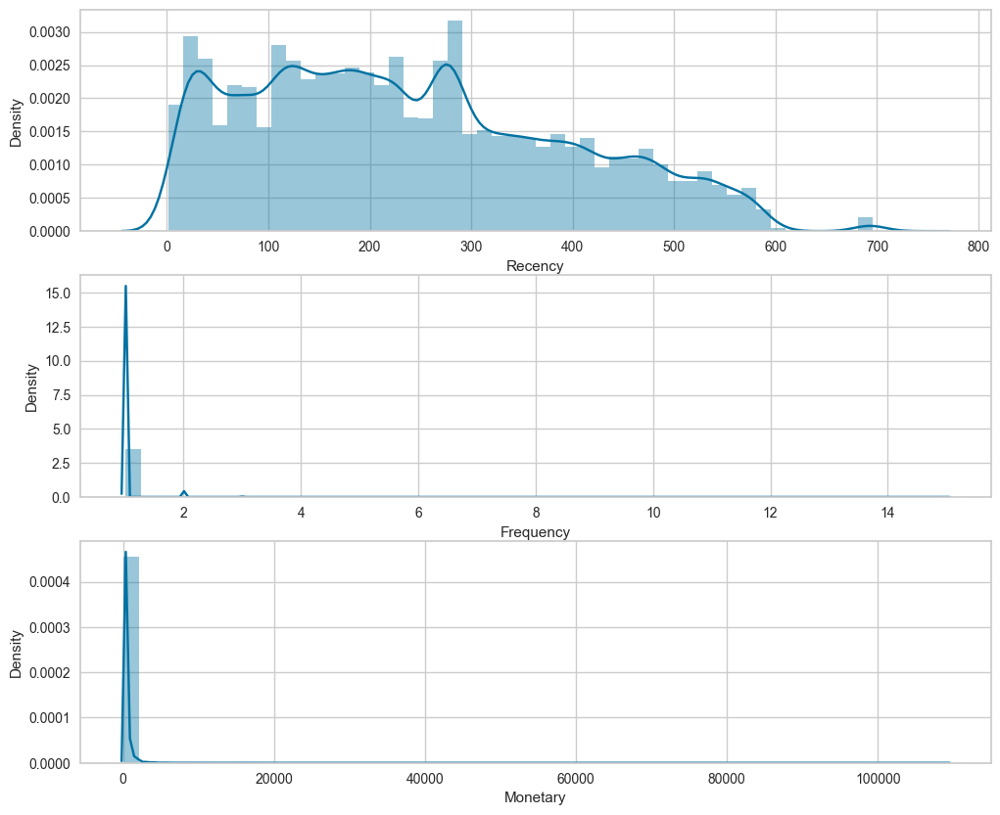

In [22]:
plt.figure(figsize=(12, 10))
plt.subplot(3, 1, 1); sns.distplot(RFM_df['Recency'])
plt.subplot(3, 1, 2); sns.distplot(RFM_df['Frequency'])
plt.subplot(3, 1, 3); sns.distplot(RFM_df['Monetary'])
plt.show()

In [24]:
RFM_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93000 entries, 0 to 92999
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   customer_unique_id  93000 non-null  object 
 1   Recency             93000 non-null  int64  
 2   Frequency           93000 non-null  int64  
 3   Monetary            93000 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 2.8+ MB


# Checking outliers

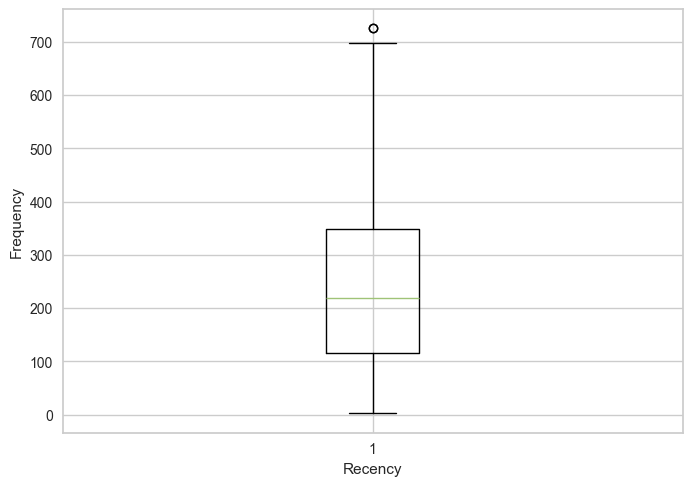

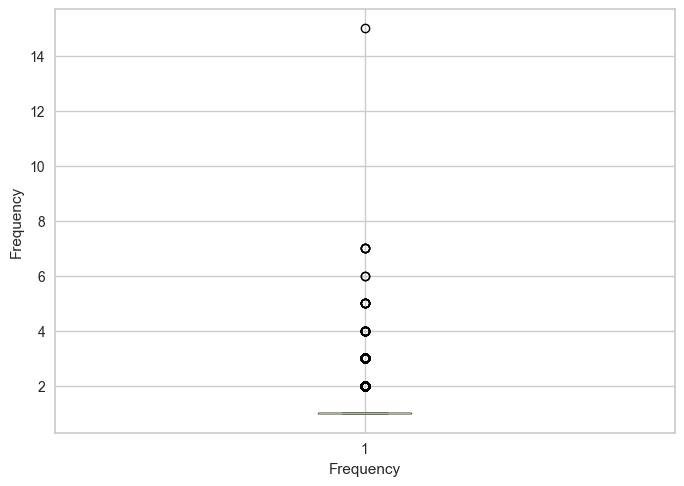

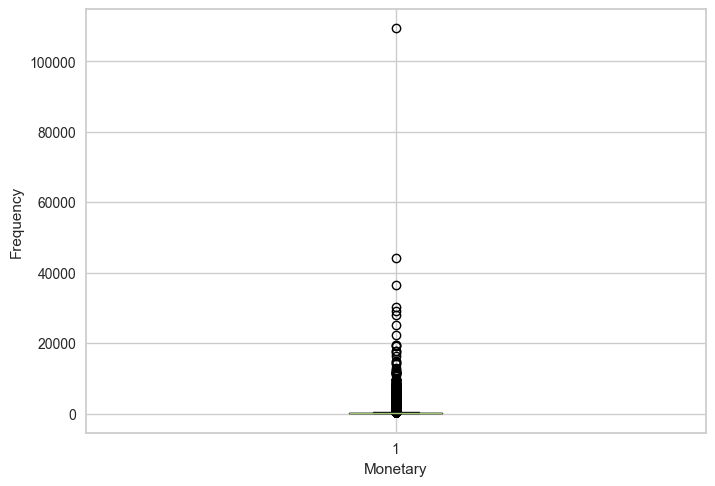

In [23]:
for i in ["Recency", "Frequency", "Monetary"]:
    plt.figure()
    plt.tight_layout()
    plt.gca().set(xlabel= i, ylabel='Frequency')
    plt.boxplot(RFM_df[i])

In [26]:
# outliers that fall with +/- 5% boundaries
def num_outlier(df_in, col_name):
    q1 = df_in[col_name].quantile(0.05)
    q3 = df_in[col_name].quantile(0.95)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    outliers_df= df_in.loc[(df_in[col_name] < fence_low) | (df_in[col_name] > fence_high)]
    return print("Number of outliers in {} column: ".format(col_name), len(outliers_df)), print("Indexes: ", outliers_df.index)

In [27]:
for i in ["Recency", "Frequency", "Monetary"]:
    num_outlier(RFM_df, i)
    print("*"*40)

Number of outliers in Recency column:  0
Indexes:  Index([], dtype='int64')
****************************************
Number of outliers in Frequency column:  2206
Indexes:  Index([  103,   119,   139,   242,   402,   417,   426,   436,   465,   467,
       ...
       92245, 92354, 92387, 92394, 92408, 92465, 92568, 92832, 92848, 92956],
      dtype='int64', length=2206)
****************************************
Number of outliers in Monetary column:  1023
Indexes:  Index([  128,   220,   255,   287,   414,   537,   569,   606,   612,   702,
       ...
       92644, 92649, 92674, 92724, 92770, 92822, 92842, 92906, 92988, 92995],
      dtype='int64', length=1023)
****************************************


In [26]:
RFM_df.shape

(93000, 4)

In [28]:
# remove outliers that fall with +/- 5% boundaries, except Frequency columns
def remove_outlier(df_in, col_name):
    q1 = df_in[col_name].quantile(0.05)
    q3 = df_in[col_name].quantile(0.95)
    iqr = q3-q1     
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    index_outliers= df_in.loc[(df_in[col_name] < fence_low) | (df_in[col_name] > fence_high)].index
    df_in= pd.DataFrame(df_in.drop(index_outliers.to_list(), axis=0, inplace=True))
    print("Outliers in the {} column have been removed".format(col_name))
    return df_in

In [29]:
for i in ["Recency", "Monetary"]:
    remove_outlier(RFM_df, i)
    print("*"*40)

Outliers in the Recency column have been removed
****************************************
Outliers in the Monetary column have been removed
****************************************


In [31]:
RFM_df.shape

(91977, 4)

In [30]:
RFM_df2= RFM_df.copy()
RFM_df2= RFM_df2.set_index('customer_unique_id')
RFM_df2

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,113,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,116,1,27.19
0000f46a3911fa3c0805444483337064,538,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62
0004aac84e0df4da2b147fca70cf8255,289,1,196.89
...,...,...,...
fffcc512b7dfecaffd80f13614af1d16,142,1,710.70
fffea47cd6d3cc0a88bd621562a9d061,263,1,84.58
ffff371b4d645b6ecea244b27531430a,569,1,112.46


# RFM segments

In [31]:
RFM_df2["recency_score"]  = pd.qcut(RFM_df2['Recency'], 5, labels=[5, 4, 3, 2, 1])
RFM_df2["frequency_score"]= pd.qcut(RFM_df2['Frequency'].rank(method="first"), 5, labels=[1, 2, 3, 4, 5])
RFM_df2["monetary_score"] = pd.qcut(RFM_df2['Monetary'], 5, labels=[1, 2, 3, 4, 5])

In [32]:
# Concatanated RFM scores:
RFM_df2['RFM_SCORE'] = RFM_df2.recency_score.astype(str)+ RFM_df2.frequency_score.astype(str) + RFM_df2.monetary_score.astype(str)
RFM_df2

,Recency,Frequency,Monetary,recency_score,frequency_score,monetary_score,RFM_SCORE
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,113,1,141.90,4,1,4,414
0000b849f77a49e4a4ce2b2a4ca5be3f,116,1,27.19,4,1,1,411
0000f46a3911fa3c0805444483337064,538,1,86.22,1,1,2,112
0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62,2,1,1,211
0004aac84e0df4da2b147fca70cf8255,289,1,196.89,2,1,4,214
...,...,...,...,...,...,...,...
fffcc512b7dfecaffd80f13614af1d16,142,1,710.70,4,5,5,455
fffea47cd6d3cc0a88bd621562a9d061,263,1,84.58,3,5,2,352
ffff371b4d645b6ecea244b27531430a,569,1,112.46,1,5,3,153


In [33]:
seg_map= {
    r'111|112|121|131|141|151': 'Lost customers',
    r'332|322|233|232|223|222|132|123|122|212|211': 'Hibernating customers', 
    r'155|154|144|214|215|115|114|113': 'Cannot Lose Them',
    r'255|254|245|244|253|252|243|242|235|234|225|224|153|152|145|143|142|135|134|133|125|124': 'At Risk',
    r'331|321|312|221|213|231|241|251': 'About To Sleep',
    r'535|534|443|434|343|334|325|324': 'Need Attention',
    r'525|524|523|522|521|515|514|513|425|424|413|414|415|315|314|313': 'Promising',
    r'512|511|422|421|412|411|311': 'New Customers',
    r'553|551|552|541|542|533|532|531|452|451|442|441|431|453|433|432|423|353|352|351|342|341|333|323': 'Potential Loyalist',
    r'543|444|435|355|354|345|344|335': 'Loyal',
    r'555|554|544|545|454|455|445': 'Champions'
}

In [34]:
RFM_df2['Segment'] = RFM_df2['recency_score'].astype(str) + RFM_df2['frequency_score'].astype(str) + RFM_df2['monetary_score'].astype(str)
RFM_df2['Segment'] = RFM_df2['Segment'].replace(seg_map, regex=True)
RFM_df2

,Recency,Frequency,Monetary,recency_score,frequency_score,monetary_score,RFM_SCORE,Segment
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,113,1,141.90,4,1,4,414,Promising
0000b849f77a49e4a4ce2b2a4ca5be3f,116,1,27.19,4,1,1,411,New Customers
0000f46a3911fa3c0805444483337064,538,1,86.22,1,1,2,112,Lost customers
0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62,2,1,1,211,Hibernating customers
0004aac84e0df4da2b147fca70cf8255,289,1,196.89,2,1,4,214,Cannot Lose Them
...,...,...,...,...,...,...,...,...
fffcc512b7dfecaffd80f13614af1d16,142,1,710.70,4,5,5,455,Champions
fffea47cd6d3cc0a88bd621562a9d061,263,1,84.58,3,5,2,352,Potential Loyalist
ffff371b4d645b6ecea244b27531430a,569,1,112.46,1,5,3,153,At Risk


In [35]:
RFM_df2['Segment'].unique()

array(['Promising', 'New Customers', 'Lost customers',
       'Hibernating customers', 'Cannot Lose Them', 'About To Sleep',
       'Loyal', 'Champions', 'Potential Loyalist', 'At Risk',
       'Need Attention'], dtype=object)

In [36]:
RFM_df2['Segment'].nunique()

11

In [37]:
RFMStats = RFM_df2[["Segment", "Recency", "Frequency", "Monetary"]].groupby("Segment").agg(['mean','median', 'min', 'max', 'count'])
RFMStats

Recency                         Frequency         \
                             mean median  min  max  count      mean median   
Segment                                                                      
About To Sleep         278.595300  279.0  179  384   5787  1.000346    1.0   
At Risk                387.830405  368.0  270  725  15991  1.030830    1.0   
Cannot Lose Them       437.208753  439.0  270  697   5758  1.033519    1.0   
Champions               85.574868   82.0    2  178   5690  1.176450    1.0   
Hibernating customers  343.781739  327.0  179  725   8302  1.000000    1.0   
Lost customers         476.559022  470.0  385  696   4583  1.002182    1.0   
Loyal                  178.242594  193.0    2  269   5874  1.061628    1.0   
Need Attention         156.385228  177.0    2  269   5646  1.000000    1.0   
New Customers          124.484287  128.0    2  269   5123  1.000000    1.0   
Potential Loyalist     131.557910  131.0    2  269  17415  1.015906    1.0   
Promising              106.726711   93.0    2  269  11808  1.000000    1.0   

                                        Monetary                            \
                      min max  count        mean   median     min      max   
Segment                                                                      
About To Sleep          1   2   5787   52.433188   44.640   10.07   137.28   
At Risk                 1   6  15991  241.564012  160.180   55.46  1592.64   
Cannot Lose Them        1   3   5758  281.260761  196.955   88.55  1590.25   
Champions               1  15   5690  357.931476  254.730  137.63  1591.22   
Hibernating customers   1   1   8302   79.174835   75.070   11.63   137.60   
Lost customers          1   3   4583   45.069204   43.100   12.28    88.32   
Loyal                   1   7   5874  316.693589  230.120   88.49  1589.44   
Need Attention          1   1   5646  231.025106  170.710   88.48  1594.76   
New Customers           1   1   5123   52.763777   51.050    9.59    88.45   
Potential Loyalist      1   3  17415   74.380314   70.120   10.89   137.60   
Promising               1   1  11808  232.231512  162.890   14.06  1594.44   

                              
                       count  
Segment                       
About To Sleep          5787  
At Risk                15991  
Cannot Lose Them        5758  
Champions               5690  
Hibernating customers   8302  
Lost customers          4583  
Loyal                   5874  
Need Attention          5646  
New Customers           5123  
Potential Loyalist     17415  
Promising              11808

In [38]:
RFMStats['Ratio']= (100*RFMStats['Monetary']["count"]/RFMStats['Monetary']["count"].sum()).round(2)
RFMStats

Recency                         Frequency         \
                             mean median  min  max  count      mean median   
Segment                                                                      
About To Sleep         278.595300  279.0  179  384   5787  1.000346    1.0   
At Risk                387.830405  368.0  270  725  15991  1.030830    1.0   
Cannot Lose Them       437.208753  439.0  270  697   5758  1.033519    1.0   
Champions               85.574868   82.0    2  178   5690  1.176450    1.0   
Hibernating customers  343.781739  327.0  179  725   8302  1.000000    1.0   
Lost customers         476.559022  470.0  385  696   4583  1.002182    1.0   
Loyal                  178.242594  193.0    2  269   5874  1.061628    1.0   
Need Attention         156.385228  177.0    2  269   5646  1.000000    1.0   
New Customers          124.484287  128.0    2  269   5123  1.000000    1.0   
Potential Loyalist     131.557910  131.0    2  269  17415  1.015906    1.0   
Promising              106.726711   93.0    2  269  11808  1.000000    1.0   

                                        Monetary                            \
                      min max  count        mean   median     min      max   
Segment                                                                      
About To Sleep          1   2   5787   52.433188   44.640   10.07   137.28   
At Risk                 1   6  15991  241.564012  160.180   55.46  1592.64   
Cannot Lose Them        1   3   5758  281.260761  196.955   88.55  1590.25   
Champions               1  15   5690  357.931476  254.730  137.63  1591.22   
Hibernating customers   1   1   8302   79.174835   75.070   11.63   137.60   
Lost customers          1   3   4583   45.069204   43.100   12.28    88.32   
Loyal                   1   7   5874  316.693589  230.120   88.49  1589.44   
Need Attention          1   1   5646  231.025106  170.710   88.48  1594.76   
New Customers           1   1   5123   52.763777   51.050    9.59    88.45   
Potential Loyalist      1   3  17415   74.380314   70.120   10.89   137.60   
Promising               1   1  11808  232.231512  162.890   14.06  1594.44   

                              Ratio  
                       count         
Segment                              
About To Sleep          5787   6.29  
At Risk                15991  17.39  
Cannot Lose Them        5758   6.26  
Champions               5690   6.19  
Hibernating customers   8302   9.03  
Lost customers          4583   4.98  
Loyal                   5874   6.39  
Need Attention          5646   6.14  
New Customers           5123   5.57  
Potential Loyalist     17415  18.93  
Promising              11808  12.84

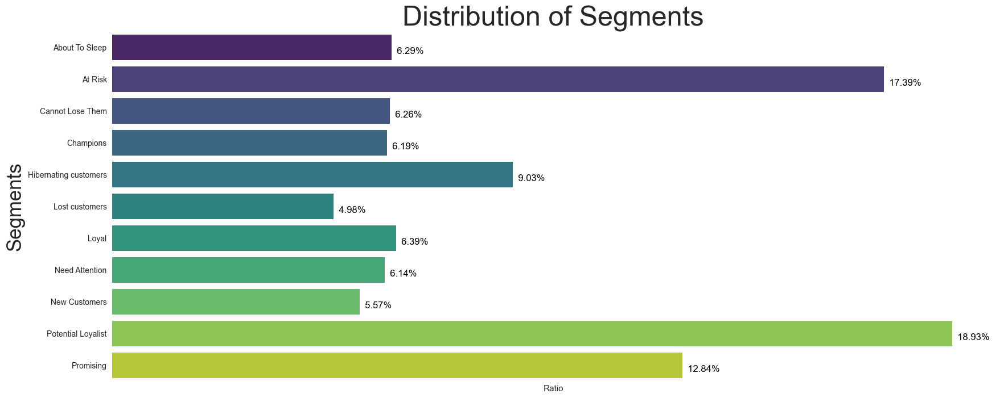

In [39]:
plt.figure(figsize=(20,8))
#plt.rc('font', size=20)
per= sns.barplot(x=RFMStats['Ratio'], y=RFMStats.index, data=RFMStats, palette="viridis")
sns.despine(bottom = True, left = True)
for i, v in enumerate(RFMStats['Ratio']):
    per.text(v, i+.20,"  {:.2f}".format(v)+"%", color='black', ha="left")
per.set_ylabel('Segments', fontsize=25)
per.set(xticks=[])
plt.title('Distribution of Segments', fontsize=35)
plt.show()

Text(0.5, 0.98, 'Recency and Frequency Grid')

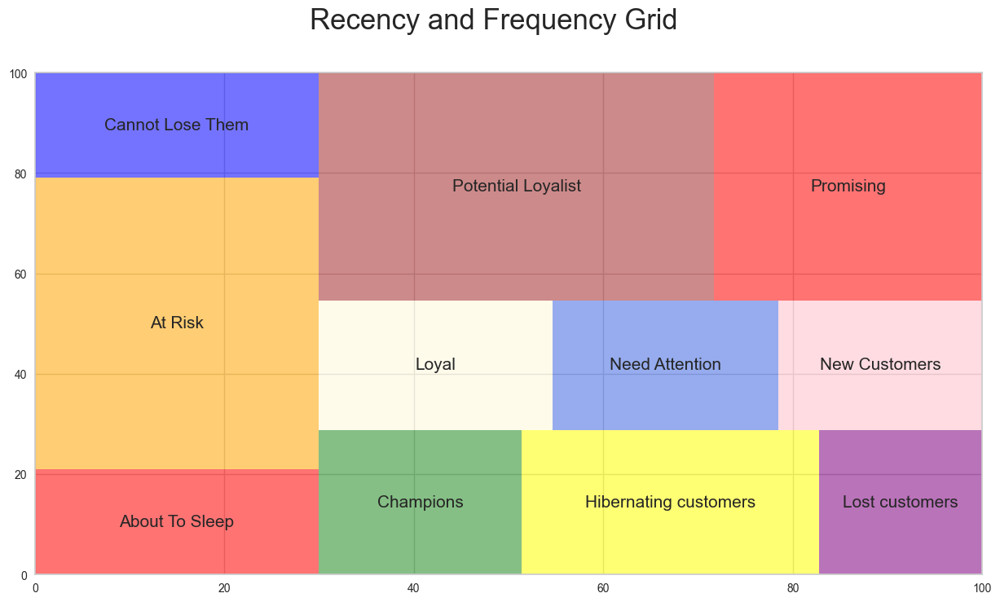

In [40]:
# Treemap by recency/frequency
plt.figure(figsize=(15,8))
plt.rc('font', size=15)
squarify.plot(sizes=RFMStats["Recency"]["count"], label=RFMStats.index, 
              color=["red","orange","blue", "forestgreen", "yellow", "purple", "cornsilk","royalblue", "pink", "brown"], alpha=.55)
plt.suptitle("Recency and Frequency Grid", fontsize=25)

# Clustering with K-means

In [41]:
RFM_df3= RFM_df2.drop(["recency_score", "frequency_score", "monetary_score", "RFM_SCORE", "Segment"], axis=1)
RFM_df3

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,113,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,116,1,27.19
0000f46a3911fa3c0805444483337064,538,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62
0004aac84e0df4da2b147fca70cf8255,289,1,196.89
...,...,...,...
fffcc512b7dfecaffd80f13614af1d16,142,1,710.70
fffea47cd6d3cc0a88bd621562a9d061,263,1,84.58
ffff371b4d645b6ecea244b27531430a,569,1,112.46


In [42]:
#check if data is skewed
from scipy import stats #library
def check_skew(df, column):
    skew = stats.skew(df[column])
    skewtest = stats.skewtest(df[column])
    plt.title('Distribution of ' + column)
    sns.distplot(df[column])
    plt.show()
    print("{}'s: Skew: {}, : {}".format(column, skew, skewtest))
    return

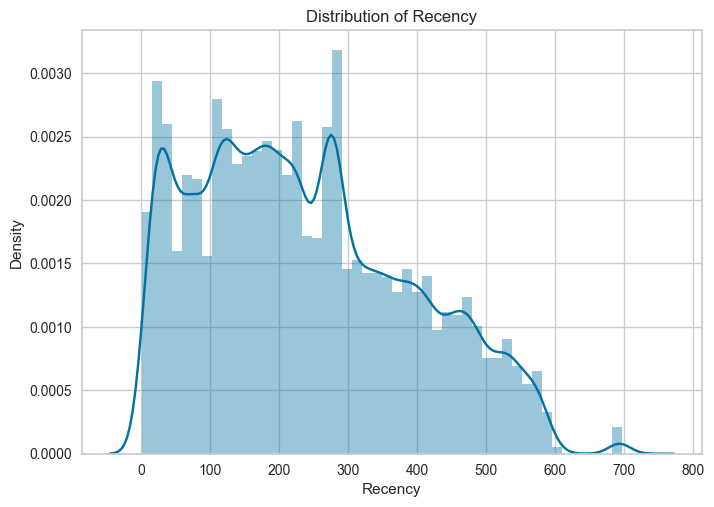

Recency's: Skew: 0.4532435564282202, : SkewtestResult(statistic=53.5789286421484, pvalue=0.0)


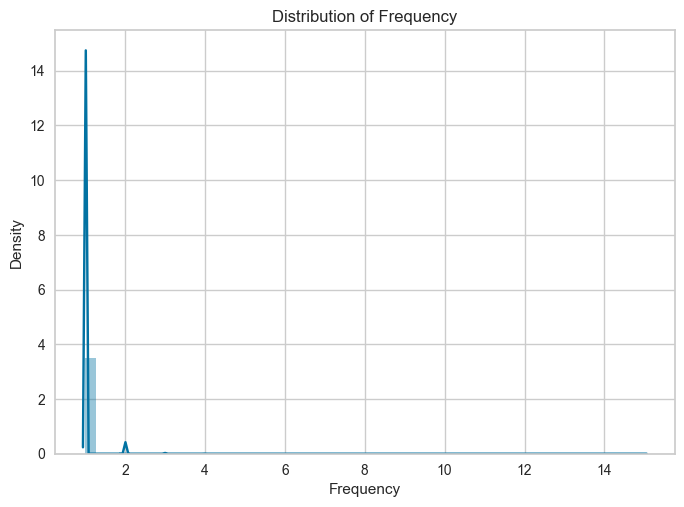

Frequency's: Skew: 13.223604389509108, : SkewtestResult(statistic=351.74300514618756, pvalue=0.0)


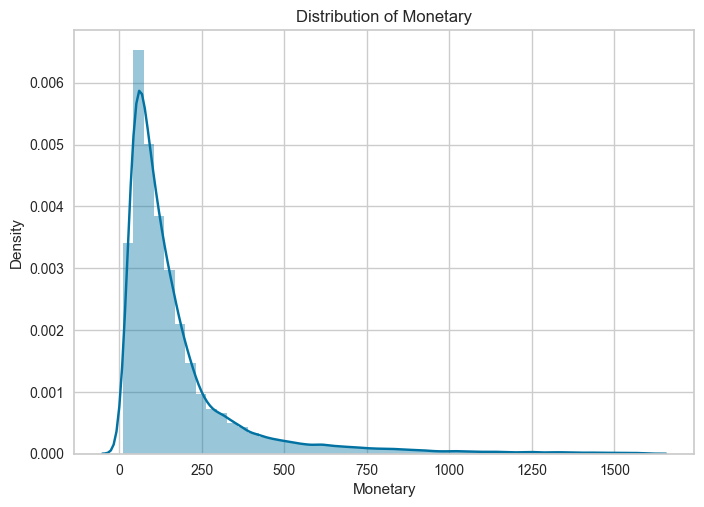

Monetary's: Skew: 3.1535353145913074, : SkewtestResult(statistic=208.35727861503352, pvalue=0.0)


In [42]:
for col in RFM_df3.columns:
    check_skew(RFM_df3, col)

- The skewness value greater than 1 or less than -1 indicates a highly skewed distribution.
- The value between 0.5 and 1 or -0.5 and -1 is moderately skewed.
- The value between -0.5 and 0.5 indicates that the distribution is fairly symmetrical.

In [43]:
# apply log transform for the Frequency and Monetary columns as they are very skewed
RFM_log= RFM_df3.copy()
for i in RFM_log.columns[1:]:
    RFM_log[i] = np.log10(RFM_log[i])

In [44]:
RFM_log

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,113,0.0,2.151982
0000b849f77a49e4a4ce2b2a4ca5be3f,116,0.0,1.434409
0000f46a3911fa3c0805444483337064,538,0.0,1.935608
0000f6ccb0745a6a4b88665a16c9f078,322,0.0,1.639686
0004aac84e0df4da2b147fca70cf8255,289,0.0,2.294224
...,...,...,...
fffcc512b7dfecaffd80f13614af1d16,142,0.0,2.851686
fffea47cd6d3cc0a88bd621562a9d061,263,0.0,1.927268
ffff371b4d645b6ecea244b27531430a,569,0.0,2.050998


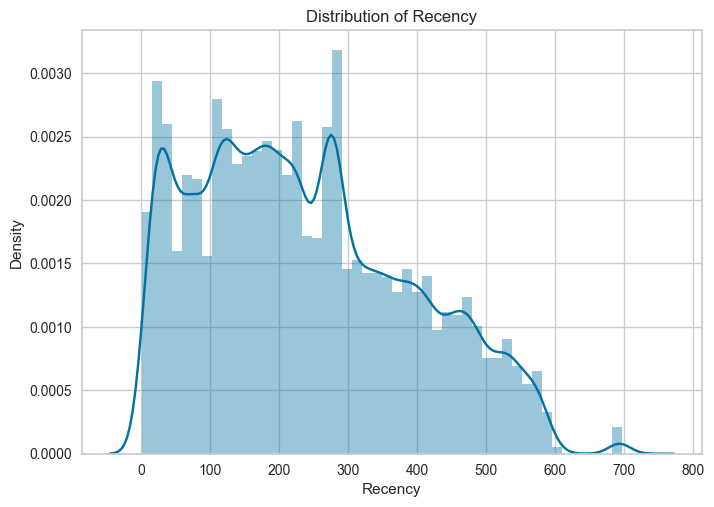

Recency's: Skew: 0.4532435564282202, : SkewtestResult(statistic=53.5789286421484, pvalue=0.0)


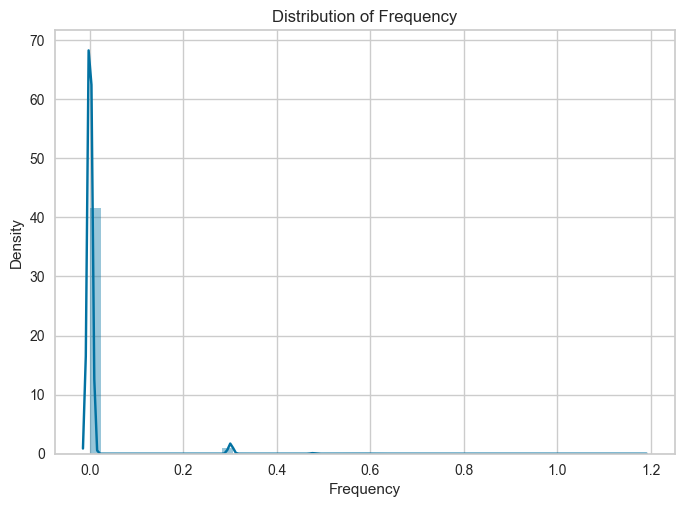

Frequency's: Skew: 6.94311906323528, : SkewtestResult(statistic=286.852341356518, pvalue=0.0)


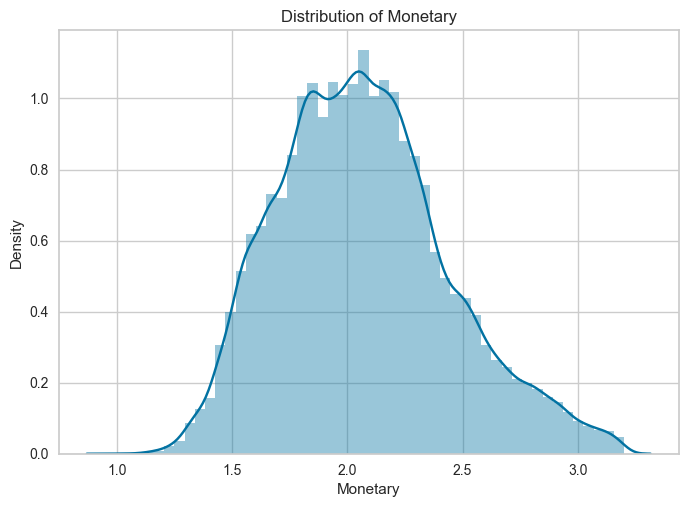

Monetary's: Skew: 0.4345218403369916, : SkewtestResult(statistic=51.54222361324475, pvalue=0.0)


In [45]:
for col in RFM_log.columns:
    check_skew(RFM_log, col)

In [45]:
# apply StandardScaler
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()

RFM_log_scaled= scaler.fit_transform(RFM_log)
RFM_log_scaled_df= pd.DataFrame(RFM_log_scaled)
RFM_log_scaled_df.columns = ['recency', 'frequency', 'monetary']
RFM_log_scaled_df

,recency,frequency,monetary
0,-0.822667,-0.151094,0.224342
1,-0.803068,-0.151094,-1.705015
2,1.953873,-0.151094,-0.357429
3,0.542737,-0.151094,-1.153083
4,0.327147,-0.151094,0.606790
...,...,...,...
91972,-0.633209,-0.151094,2.105655
91973,0.157288,-0.151094,-0.379854
91974,2.156397,-0.151094,-0.047177
91975,-0.776936,-0.151094,0.154749


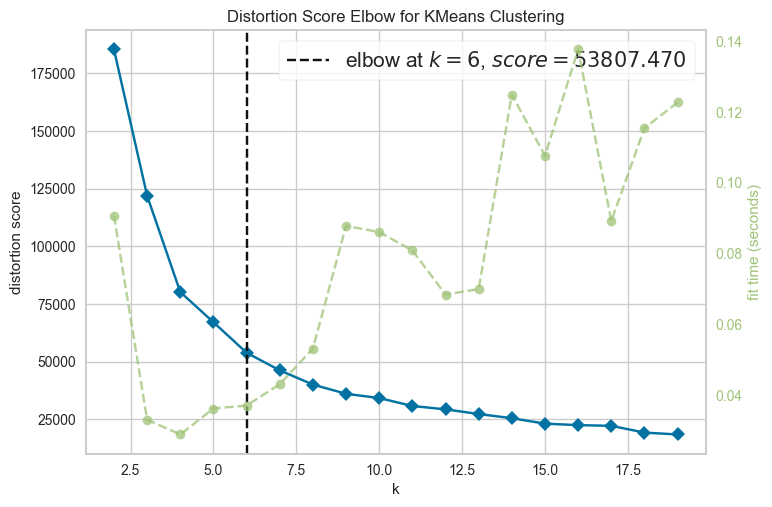

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [46]:
k_means = KMeans()
elbow = KElbowVisualizer(k_means, k=(2, 20))
elbow.fit(RFM_log_scaled_df)
elbow.show()

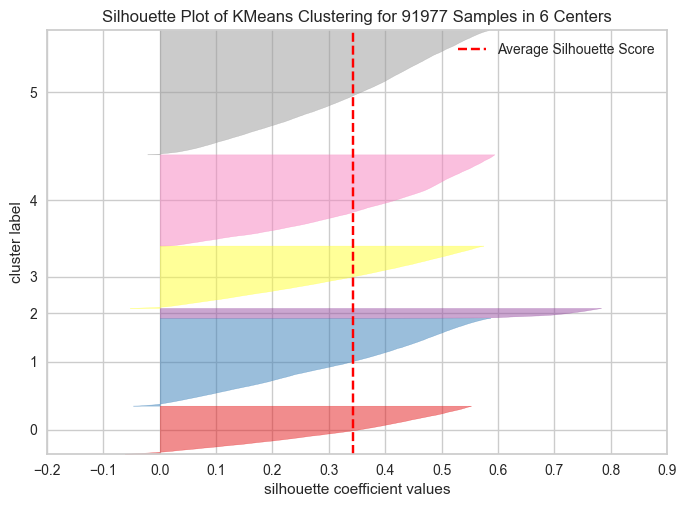

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 91977 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [56]:
# Số lượng cụm tối ưu từ biểu đồ Elbow
optimal_clusters = elbow.elbow_value_

k_means_optimal = KMeans(n_clusters=optimal_clusters, random_state=10)
silhouette_visualizer = SilhouetteVisualizer(k_means_optimal)

silhouette_visualizer.fit(RFM_log_scaled_df)
silhouette_visualizer.show()

The optimal K value for Elbow was found to be 6.

In [47]:
kmeans= KMeans(n_clusters=elbow.elbow_value_)
kmeans.fit(RFM_log_scaled_df)

KMeans(n_clusters=6)

In [49]:
RFM_log_scaled_df['Cluster']= kmeans.labels_
RFM_log_scaled_df

,recency,frequency,monetary,Cluster
0,-0.822667,-0.151094,0.224342,0
1,-0.803068,-0.151094,-1.705015,3
2,1.953873,-0.151094,-0.357429,1
3,0.542737,-0.151094,-1.153083,1
4,0.327147,-0.151094,0.606790,5
...,...,...,...,...
91972,-0.633209,-0.151094,2.105655,0
91973,0.157288,-0.151094,-0.379854,5
91974,2.156397,-0.151094,-0.047177,1
91975,-0.776936,-0.151094,0.154749,0


In [50]:
# Function to visualize clusters
def rfm_clusters_stat(df):
    df_new = df.groupby(['Cluster']).agg({
            'Recency'  : ['mean','median', 'min', 'max'],
            'Frequency': ['mean','median', 'min', 'max'],
            'Monetary' : ['mean','median', 'min', 'max', 'count']
        }).round(0)

    return df_new

In [51]:
RFM_df4= RFM_df3.copy()
RFM_df4['Cluster'] = kmeans.labels_
RFM_df4

,Recency,Frequency,Monetary,Cluster
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,113,1,141.90,0
0000b849f77a49e4a4ce2b2a4ca5be3f,116,1,27.19,3
0000f46a3911fa3c0805444483337064,538,1,86.22,1
0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62,1
0004aac84e0df4da2b147fca70cf8255,289,1,196.89,5
...,...,...,...,...
fffcc512b7dfecaffd80f13614af1d16,142,1,710.70,0
fffea47cd6d3cc0a88bd621562a9d061,263,1,84.58,5
ffff371b4d645b6ecea244b27531430a,569,1,112.46,1


In [52]:
rfm_clusters_stat(RFM_df4).style.background_gradient(cmap='YlGnBu')

- Most customers haven't placed an order in a while.
- Frequency feature did not add much to the model, as most customers placed only one order on average.

In [53]:
RFM_stats= pd.DataFrame(rfm_clusters_stat(RFM_df4))

Text(0.5, 0.98, 'Segments of Customers')

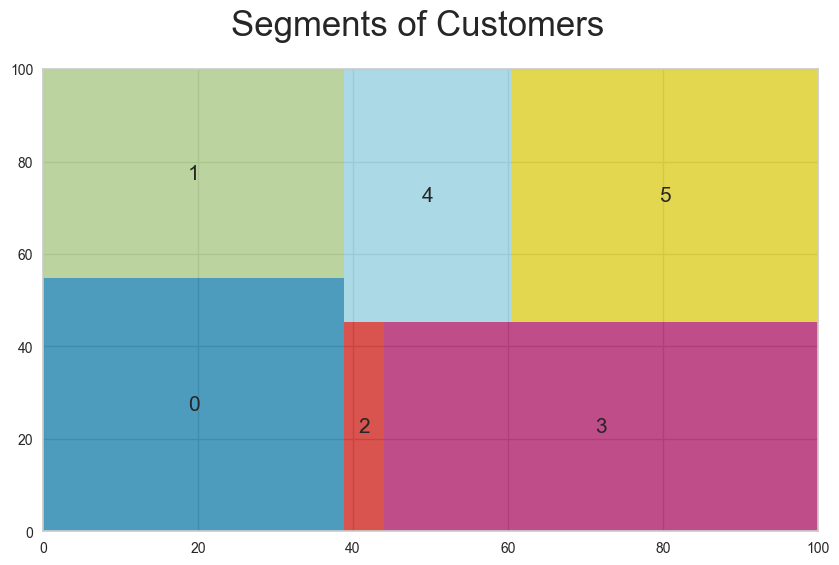

In [54]:
plt.figure(figsize=(10, 6))
squarify.plot(sizes=RFM_stats["Monetary"]["count"], label=RFM_stats.index, color=["b","g","r","m","c", "y"], alpha=0.7)
plt.suptitle("Segments of Customers", fontsize=25)

In [56]:
# Customer segments in each cluster
df_cluster_segment = pd.merge(RFM_df2, RFM_df4, left_index=True, right_index=True)
df_cluster_segment

,Recency_x,Frequency_x,Monetary_x,recency_score,frequency_score,monetary_score,RFM_SCORE,Segment,Recency_y,Frequency_y,Monetary_y,Cluster
customer_unique_id,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,113,1,141.90,4,1,4,414,Promising,113,1,141.90,0
0000b849f77a49e4a4ce2b2a4ca5be3f,116,1,27.19,4,1,1,411,New Customers,116,1,27.19,3
0000f46a3911fa3c0805444483337064,538,1,86.22,1,1,2,112,Lost customers,538,1,86.22,1
0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62,2,1,1,211,Hibernating customers,322,1,43.62,1
0004aac84e0df4da2b147fca70cf8255,289,1,196.89,2,1,4,214,Cannot Lose Them,289,1,196.89,5
...,...,...,...,...,...,...,...,...,...,...,...,...
fffcc512b7dfecaffd80f13614af1d16,142,1,710.70,4,5,5,455,Champions,142,1,710.70,0
fffea47cd6d3cc0a88bd621562a9d061,263,1,84.58,3,5,2,352,Potential Loyalist,263,1,84.58,5
ffff371b4d645b6ecea244b27531430a,569,1,112.46,1,5,3,153,At Risk,569,1,112.46,1


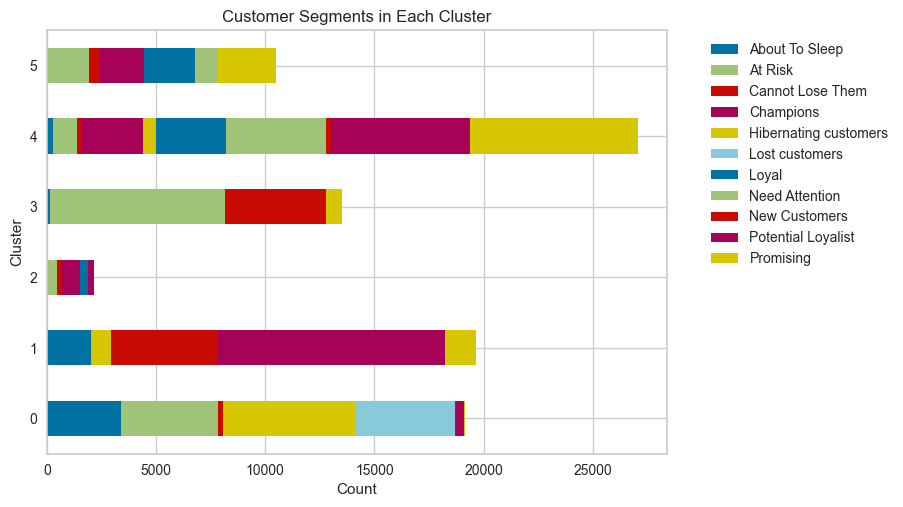

In [58]:
# Customer segments in each cluster
df_cluster_segment = pd.merge(RFM_df2, RFM_df4, left_index=True, right_index=True)

# Group by 'Cluster' and 'Segment' and count the number of customers in each group
cluster_segment_counts = df_cluster_segment.groupby(['Cluster', 'Segment']).size().unstack()

# Plot a stacked bar chart
cluster_segment_counts.plot(kind='barh', stacked=True)

plt.xlabel('Count')
plt.ylabel('Cluster')
plt.title('Customer Segments in Each Cluster')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

**Data before clustering**

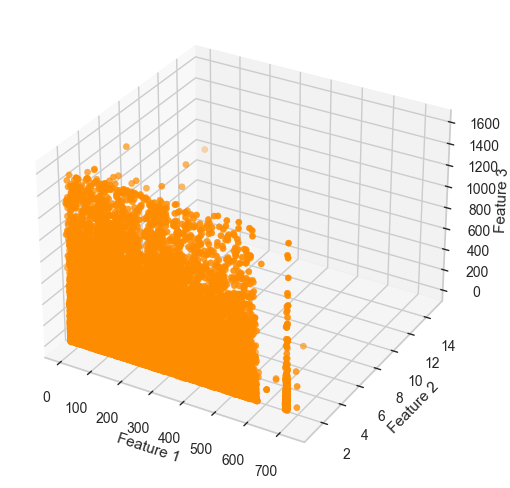

In [64]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(RFM_df4.iloc[:, 0], 
           RFM_df4.iloc[:, 1], 
           RFM_df4.iloc[:, 2])

ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')

plt.show()

**Data after clustering**

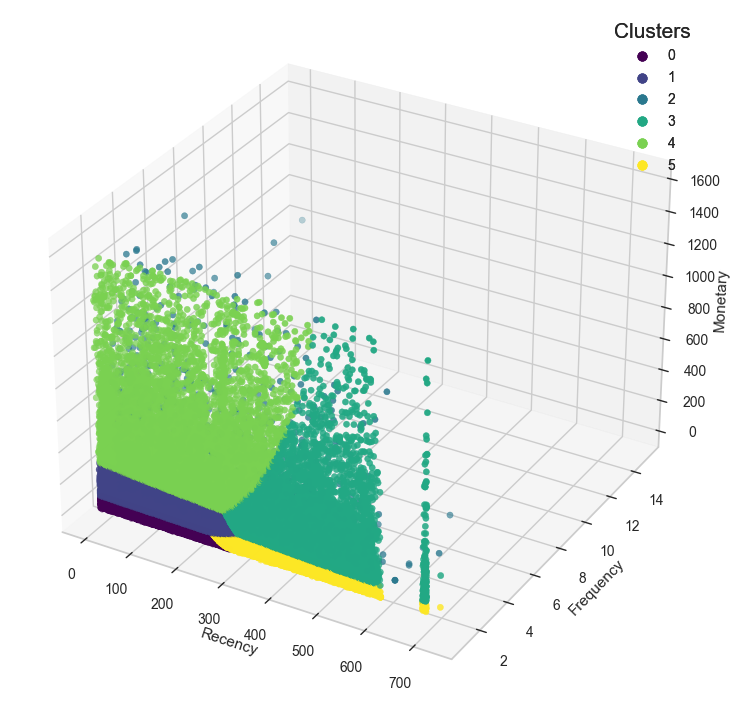

In [65]:


fig = plt.figure(figsize=(10, 9))
ax = fig.add_subplot(111, projection='3d')

# Plot the filtered DataFrame
scatter = ax.scatter(RFM_df4['Recency'], RFM_df4['Frequency'], RFM_df4['Monetary'], c=RFM_df4['Cluster'], cmap='viridis')

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')

# Create a legend for the colors
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)
plt.show()

In [66]:
def visualize3DKmeans(RFM_df4, columns, hover_data, cluster):
    fig = px.scatter_3d(RFM_df4,
                    x=columns[0],
                    y=columns[1],
                    z=columns[2],
                    color='Cluster',
                    hover_data=hover_data,
                    category_orders={"Cluster": range(0, cluster)},
                    )

    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()

In [67]:
columns = RFM_df4.columns.tolist()
hover_data=RFM_df4.columns
visualize3DKmeans(RFM_df4, columns,hover_data, 5)

In [76]:
colors = ['#9966cc', '#9775fa', '#7048e8', '#e0b0ff', '#bf80ff', '#330066']
# Calculate the percentage of customers in each cluster
cluster_percentage = (RFM_df4['Cluster'].value_counts(normalize=True) * 100).reset_index()
cluster_percentage.columns = ['Cluster', 'Percentage']
cluster_percentage.sort_values(by='Cluster', inplace=True)

fig = make_subplots(rows=1, cols=1, specs=[[{"type": "pie"}]], subplot_titles=(""))

fig.add_trace(go.Pie(labels=cluster_percentage['Cluster'], 
                     values=cluster_percentage['Percentage'], 
                     hole=.4, # This creates the hole for the donut chart
                     marker_colors=colors,
                     textinfo='label+percent'),
              row=1, col=1)

fig.update_layout(title_text="Distribution of Customers Across Clusters",
                  showlegend=False)

fig.show()


# Evaluation Matrix

In [77]:
# Compute number of customers
num_observations = len(RFM_df4)

# Separate the features and the cluster labels
X = RFM_df4.drop('Cluster', axis=1)
clusters = RFM_df4['Cluster']

# Compute the metrics
sil_score = silhouette_score(X, clusters)
calinski_score = calinski_harabasz_score(X, clusters)
davies_score = davies_bouldin_score(X, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))

+-------------------------+---------------------+
|         Metric          |        Value        |
+-------------------------+---------------------+
| Number of Observations  |        91977        |
|    Silhouette Score     | 0.19761309857727052 |
| Calinski Harabasz Score |  29926.26480548529  |
|  Davies Bouldin Score   | 1.8099696198841284  |
+-------------------------+---------------------+


- The Silhouette Score of approximately 0.198, although not close to 1, still indicates a fair amount of separation between the clusters. It suggests that the clusters are somewhat distinct, but there might be slight overlaps between them. Generally, a score closer to 1 would be ideal, indicating more distinct and well-separated clusters.
- The Calinski Harabasz Score is 29926.26, which is considerably high, indicating that the clusters are well-defined. A high score in this metric generally signals better cluster definitions, thus implying that our clustering has managed to find substantial structure in the data.
- The Davies Bouldin Score of 1.8 is a reasonable score, indicating a moderate level of similarity between each cluster and its most similar one. A lower score is generally better as it indicates less similarity between clusters, and thus, our score here suggests a decent separation between the clusters.

# Cluster Analysis and Profiling

**Radar Chart Approach**

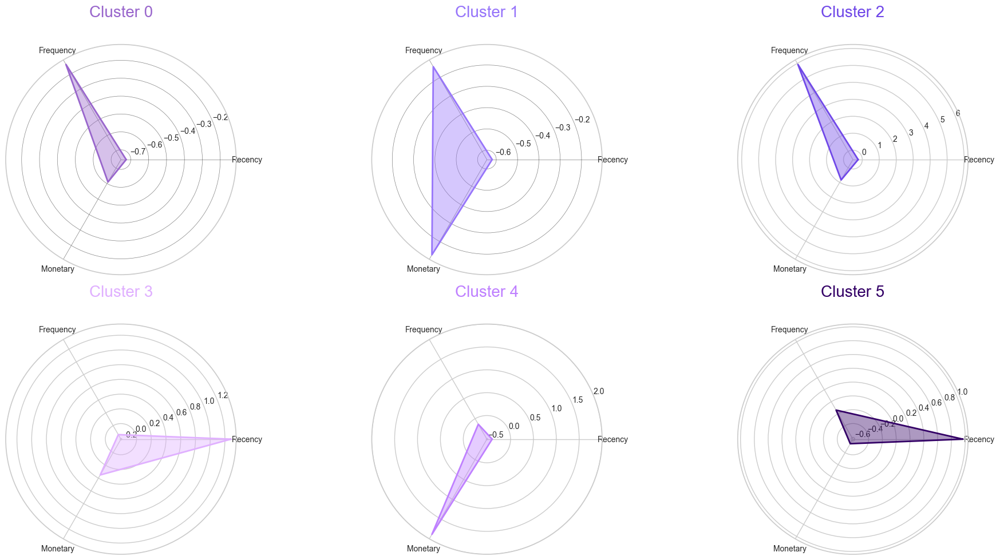

In [84]:
# Setting 'CustomerID' column as index and assigning it to a new dataframe
df_customer = RFM_df4.copy()

# Standardize the data (excluding the cluster column)
scaler = StandardScaler()
df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['Cluster'], axis=1))

# Create a new dataframe with standardized values and add the cluster column back
df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
df_customer_standardized['Cluster'] = df_customer['Cluster']

# Calculate the centroids of each cluster
cluster_centroids = df_customer_standardized.groupby('Cluster').mean()

# Function to create a radar chart
def create_radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    
    # Add a title
    ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]

# Initialize the figure
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw=dict(polar=True), nrows=2, ncols=3)

# Flatten the ax array
ax = ax.flatten()

# Create radar chart for each cluster
for i, color in enumerate(colors):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax[i], angles, data, color, i)

# Add input data
ax[0].set_xticks(angles[:-1])
ax[0].set_xticklabels(labels[:-1])

ax[1].set_xticks(angles[:-1])
ax[1].set_xticklabels(labels[:-1])

ax[2].set_xticks(angles[:-1])
ax[2].set_xticklabels(labels[:-1])

ax[3].set_xticks(angles[:-1])
ax[3].set_xticklabels(labels[:-1])

ax[4].set_xticks(angles[:-1])
ax[4].set_xticklabels(labels[:-1])

ax[5].set_xticks(angles[:-1])
ax[5].set_xticklabels(labels[:-1])

# Add a grid
ax[0].grid(color='grey', linewidth=0.5)
ax[1].grid(color='grey', linewidth=0.5)
# Display the plot
plt.tight_layout()
plt.show()

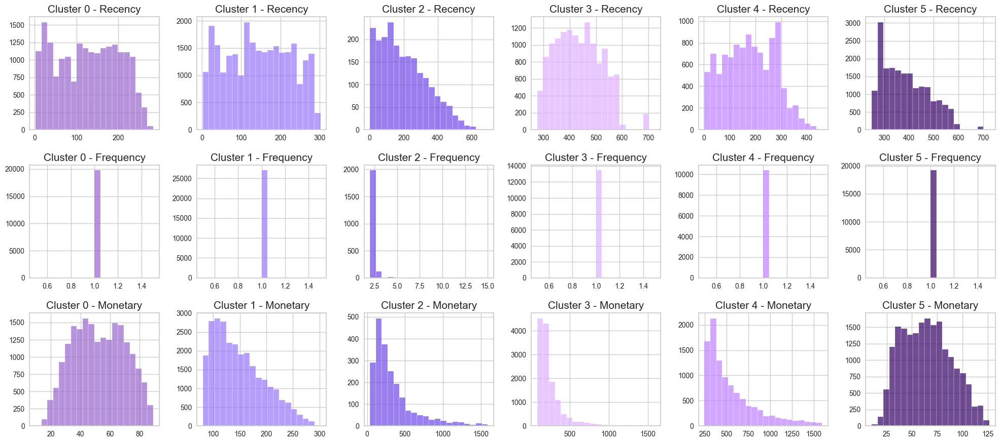

In [86]:
# Plot histograms for each feature segmented by the clusters
features = RFM_df4.columns[0:-1]
clusters = RFM_df4['Cluster'].unique()
clusters.sort()

# Setting up the subplots
n_rows = len(features)
n_cols = len(clusters)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 3*n_rows))

# Plotting histograms
for i, feature in enumerate(features):
    for j, cluster in enumerate(clusters):
        data = RFM_df4[RFM_df4['Cluster'] == cluster][feature]
        axes[i, j].hist(data, bins=20, color=colors[j], edgecolor='w', alpha=0.7)
        axes[i, j].set_title(f'Cluster {cluster} - {feature}', fontsize=15)
        axes[i, j].set_xlabel('')
        axes[i, j].set_ylabel('')

# Adjusting layout to prevent overlapping
plt.tight_layout()
plt.show()

In [57]:
RFM_df4

,Recency,Frequency,Monetary,Cluster
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,113,1,141.90,0
0000b849f77a49e4a4ce2b2a4ca5be3f,116,1,27.19,3
0000f46a3911fa3c0805444483337064,538,1,86.22,1
0000f6ccb0745a6a4b88665a16c9f078,322,1,43.62,1
0004aac84e0df4da2b147fca70cf8255,289,1,196.89,5
...,...,...,...,...
fffcc512b7dfecaffd80f13614af1d16,142,1,710.70,0
fffea47cd6d3cc0a88bd621562a9d061,263,1,84.58,5
ffff371b4d645b6ecea244b27531430a,569,1,112.46,1


In [88]:
merged_df

,customer_id,customer_unique_id,geolocation_zip_code_prefix_x,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_width_cm,payment_id,payment_sequential,payment_type,payment_installments,payment_value,geolocation_zip_code_prefix_y,seller_city,seller_state,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,31.0,19779,1,credit_card,2,146.87,8577,itaquaquecetuba,SP,office_furniture
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,31.0,78735,1,credit_card,1,275.79,8577,itaquaquecetuba,SP,office_furniture
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,31.0,78735,1,credit_card,1,275.79,8577,itaquaquecetuba,SP,office_furniture
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,...,31.0,85988,1,credit_card,7,140.61,8577,itaquaquecetuba,SP,office_furniture
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,...,31.0,7820,1,credit_card,10,137.58,8577,itaquaquecetuba,SP,office_furniture
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113737,e548277911829ffe81aac2b4407de701,a0abd26659c9914690cbd3320d39fd96,92412,canoas,RS,a5f8439f1e560659a492608e370ecde2,delivered,2017-05-27 14:03:20,2017-05-27 14:15:16,2017-05-29 09:30:43,...,55.0,15629,1,credit_card,10,232.19,89701,concordia,SC,la_cuisine
113738,0fbd856ba1d4961786fb54bd448eb7fe,96328ac15f58fbb232fe14b182103382,89675,vargem bonita,SC,937592924b66482b823ee7ecd185d0ff,delivered,2018-03-31 19:17:43,2018-03-31 19:55:18,2018-04-02 19:10:46,...,43.0,64683,1,credit_card,8,426.70,89701,concordia,SC,la_cuisine
113739,aa0533eb31ed3be79086f11bb2bec430,a490d5875edefe9bb8f5101ec2f6b56f,13870,sao joao da boa vista,SP,e22a3e8048469ea68906f666d446c25c,delivered,2017-08-28 09:48:01,2017-08-28 10:05:04,2017-08-29 11:05:28,...,15.0,68164,1,credit_card,3,160.46,89701,concordia,SC,la_cuisine
113740,d11524bb77c28efad04e4467eac8a660,6968d41eb700f1ea39424e04b854bf7e,30130,belo horizonte,MG,1ce0acf125f1bcd636276dd213363196,delivered,2017-07-31 18:10:29,2017-07-31 18:25:20,2017-08-02 18:22:30,...,40.0,12613,1,credit_card,2,55.18,89701,concordia,SC,la_cuisine


# Recommendation System

Suggesting the top three products popular within their cluster that they have not yet purchased.

In [58]:
df = RFM_df4.copy()
df = df.reset_index()

# Step 1: Merge the transaction data with the customer data to get the cluster information for each transaction
merged_data = merged_df.merge(df[['customer_unique_id', 'Cluster']], on='customer_unique_id', how='inner')

# Step 2: Identify the top 10 best-selling products in each cluster based on the total quantity sold
# Count the number of times each product_id appears in each cluster
product_counts = merged_data.groupby(['Cluster', 'product_id', 'product_category_name_english']).size().reset_index(name='Quantity')

# Sort by 'Cluster' and 'Quantity' in descending order
product_counts = product_counts.sort_values(by=['Cluster', 'Quantity'], ascending=[True, False])

# Get the top 10 products in each cluster
top_products_per_cluster = product_counts.groupby('Cluster').head(10)

# Step 3: Create a record of products purchased by each customer in each cluster
customer_purchases = merged_data.groupby(['customer_unique_id', 'Cluster', 'product_id']).size().reset_index(name='Quantity')

# Step 4: Generate recommendations for each customer in each cluster
recommendations = []
for cluster in top_products_per_cluster['Cluster'].unique():
    top_products = top_products_per_cluster[top_products_per_cluster['Cluster'] == cluster]
    customers_in_cluster = df[df['Cluster'] == cluster]['customer_unique_id']
    
    for customer in customers_in_cluster:
        # Identify products already purchased by the customer
        customer_purchased_products = customer_purchases[(customer_purchases['customer_unique_id'] == customer) & 
                                                         (customer_purchases['Cluster'] == cluster)]['product_id'].tolist()
        
        # Find top 3 products in the best-selling list that the customer hasn't purchased yet
        top_products_not_purchased = top_products[~top_products['product_id'].isin(customer_purchased_products)]
        top_3_products_not_purchased = top_products_not_purchased.head(3)
        
        # Append the recommendations to the list
        recommendations.append([customer, cluster] + top_3_products_not_purchased[['product_id', 'product_category_name_english']].values.flatten().tolist())

# Step 5: Create a dataframe from the recommendations list and merge it with the original customer data
recommendations_df = pd.DataFrame(recommendations, columns=['customer_unique_id', 'Cluster', 'Rec1_StockCode', 'Rec1_Description', \
                                                 'Rec2_StockCode', 'Rec2_Description', 'Rec3_StockCode', 'Rec3_Description'])
customer_data_with_recommendations = df.merge(recommendations_df, on=['customer_unique_id', 'Cluster'], how='right')

In [59]:
customer_data_with_recommendations.to_csv('customer_data_with_recommendations.csv', index=False)
customer_data_with_recommendations

,customer_unique_id,Recency,Frequency,Monetary,Cluster,Rec1_StockCode,Rec1_Description,Rec2_StockCode,Rec2_Description,Rec3_StockCode,Rec3_Description
0,0000366f3b9a7992bf8c76cfdf3221e2,113,1,141.90,0,3dd2a17168ec895c781a9191c1e95ad7,computers_accessories,d1c427060a0f73f6b889a5c7c61f2ac4,computers_accessories,bb50f2e236e5eea0100680137654686c,health_beauty
1,0004bd2a26a76fe21f786e4fbd80607f,147,1,166.98,0,3dd2a17168ec895c781a9191c1e95ad7,computers_accessories,d1c427060a0f73f6b889a5c7c61f2ac4,computers_accessories,bb50f2e236e5eea0100680137654686c,health_beauty
2,00053a61a98854899e70ed204dd4bafe,184,1,838.36,0,3dd2a17168ec895c781a9191c1e95ad7,computers_accessories,d1c427060a0f73f6b889a5c7c61f2ac4,computers_accessories,bb50f2e236e5eea0100680137654686c,health_beauty
3,000fbf0473c10fc1ab6f8d2d286ce20c,36,1,1449.52,0,3dd2a17168ec895c781a9191c1e95ad7,computers_accessories,d1c427060a0f73f6b889a5c7c61f2ac4,computers_accessories,bb50f2e236e5eea0100680137654686c,health_beauty
4,0015752e079902b12cd00b9b7596276b,28,1,149.64,0,3dd2a17168ec895c781a9191c1e95ad7,computers_accessories,d1c427060a0f73f6b889a5c7c61f2ac4,computers_accessories,bb50f2e236e5eea0100680137654686c,health_beauty
...,...,...,...,...,...,...,...,...,...,...,...
91972,ffe4d6bcc48632f0bb1bedf53702cc4b,176,1,85.37,5,aca2eb7d00ea1a7b8ebd4e68314663af,furniture_decor,99a4788cb24856965c36a24e339b6058,bed_bath_table,2b4609f8948be18874494203496bc318,health_beauty
91973,ffe9be10b9a58c5464d833e8b1b2c632,277,1,155.73,5,aca2eb7d00ea1a7b8ebd4e68314663af,furniture_decor,99a4788cb24856965c36a24e339b6058,bed_bath_table,2b4609f8948be18874494203496bc318,health_beauty
91974,fffa431dd3fcdefea4b1777d114144f2,304,1,81.20,5,aca2eb7d00ea1a7b8ebd4e68314663af,furniture_decor,99a4788cb24856965c36a24e339b6058,bed_bath_table,2b4609f8948be18874494203496bc318,health_beauty
91975,fffb09418989a0dbff854a28163e47c6,256,1,73.16,5,aca2eb7d00ea1a7b8ebd4e68314663af,furniture_decor,99a4788cb24856965c36a24e339b6058,bed_bath_table,2b4609f8948be18874494203496bc318,health_beauty


# Predictict sales using Linear Regression

**First block**

In tis block the DFs bellow were mergered in one DF that contains all information about Order Itens and Products.
- df_order_items
- df_products

In [38]:
products_eng = products.merge(products_category_translation, how = 'left', on = 'product_category_name' )
df_order_items_products = order_items.merge(products_eng, how='left',on='product_id')
df_order_items_products = df_order_items_products.merge(order_payments, how='left',on='order_id')

**Second block**

In this block the output of the first blocks will be merged with df_products and all information thah we need will be in dataframe named df_complete.

In [39]:
df_complete = df_order_items_products.merge(orders, how='left', on='order_id')
df_complete.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,...,payment_type,payment_installments,payment_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,cool_stuff,58.0,598.0,...,credit_card,2.0,72.19,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,pet_shop,56.0,239.0,...,credit_card,3.0,259.83,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,moveis_decoracao,59.0,695.0,...,credit_card,5.0,216.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,perfumaria,42.0,480.0,...,credit_card,2.0,25.78,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,ferramentas_jardim,59.0,409.0,...,credit_card,3.0,218.04,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00


In [40]:
# excluding lines with missing data
df_complete = df_complete.dropna()

#excluding duplicated data
df_complete = df_complete.drop_duplicates().reset_index()

**Feature engineering**
Creating estimated delivery time

In [41]:
df_complete['order_purchase_timestamp'] = pd.to_datetime(df_complete['order_purchase_timestamp'], format="%Y-%m-%d %H:%M:%S")
df_complete['order_estimated_delivery_date'] = pd.to_datetime(df_complete['order_estimated_delivery_date'], format="%Y-%m-%d %H:%M:%S")

df_complete['estimated_delivery_time'] = df_complete.order_estimated_delivery_date - df_complete.order_purchase_timestamp

df_complete.estimated_delivery_time = list(map(lambda x: int(x.days), df_complete.estimated_delivery_time))

df_complete = df_complete.drop('index', axis=1).dropna()
df_complete

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,...,payment_installments,payment_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,estimated_delivery_time
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,cool_stuff,58.0,598.0,...,2.0,72.19,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29,15
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,pet_shop,56.0,239.0,...,3.0,259.83,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15,18
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,moveis_decoracao,59.0,695.0,...,5.0,216.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05,21
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,perfumaria,42.0,480.0,...,2.0,25.78,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20,11
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,ferramentas_jardim,59.0,409.0,...,3.0,218.04,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115873,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,utilidades_domesticas,43.0,1002.0,...,1.0,343.40,b51593916b4b8e0d6f66f2ae24f2673d,delivered,2018-04-23 13:57:06,2018-04-25 04:11:01,2018-04-25 12:09:00,2018-05-10 22:56:40,2018-05-18,24
115874,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,informatica_acessorios,31.0,232.0,...,1.0,386.53,84c5d4fbaf120aae381fad077416eaa0,delivered,2018-07-14 10:26:46,2018-07-17 04:31:48,2018-07-17 08:05:00,2018-07-23 20:31:55,2018-08-01,17
115875,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,esporte_lazer,43.0,869.0,...,3.0,116.85,29309aa813182aaddc9b259e31b870e6,delivered,2017-10-23 17:07:56,2017-10-24 17:14:25,2017-10-26 15:13:14,2017-10-28 12:22:22,2017-11-10,17
115876,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,informatica_acessorios,56.0,1306.0,...,3.0,64.71,b5e6afd5a41800fdf401e0272ca74655,delivered,2017-08-14 23:02:59,2017-08-15 00:04:32,2017-08-15 19:02:53,2017-08-16 21:59:40,2017-08-25,10


In [42]:
# Excluding unuseless data for prediction
df_intermediate = df_complete.drop(['order_id',
                                 'order_item_id',
                                 'customer_id',
                                 'shipping_limit_date',
                                 'product_description_lenght',
                                 'product_weight_g',
                                 'product_length_cm',
                                 'product_height_cm',
                                 'product_width_cm',
                                 'order_approved_at',
                                 'order_delivered_carrier_date',
                                 'order_delivered_customer_date',
                                 'order_estimated_delivery_date',
                                 'order_status'], axis=1)

df_intermediate

,product_id,seller_id,price,freight_value,product_category_name,product_name_lenght,product_photos_qty,product_category_name_english,payment_id,payment_sequential,payment_type,payment_installments,payment_value,order_purchase_timestamp,estimated_delivery_time
0,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,cool_stuff,58.0,4.0,cool_stuff,85284.0,1.0,credit_card,2.0,72.19,2017-09-13 08:59:02,15
1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,pet_shop,56.0,2.0,pet_shop,2500.0,1.0,credit_card,3.0,259.83,2017-04-26 10:53:06,18
2,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,moveis_decoracao,59.0,2.0,furniture_decor,12394.0,1.0,credit_card,5.0,216.87,2018-01-14 14:33:31,21
3,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,perfumaria,42.0,1.0,perfumery,32972.0,1.0,credit_card,2.0,25.78,2018-08-08 10:00:35,11
4,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,ferramentas_jardim,59.0,1.0,garden_tools,98712.0,1.0,credit_card,3.0,218.04,2017-02-04 13:57:51,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115873,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,299.99,43.41,utilidades_domesticas,43.0,3.0,housewares,69124.0,1.0,boleto,1.0,343.40,2018-04-23 13:57:06,24
115874,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,350.00,36.53,informatica_acessorios,31.0,1.0,computers_accessories,2777.0,1.0,boleto,1.0,386.53,2018-07-14 10:26:46,17
115875,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,99.90,16.95,esporte_lazer,43.0,1.0,sports_leisure,58889.0,1.0,credit_card,3.0,116.85,2017-10-23 17:07:56,17
115876,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,55.99,8.72,informatica_acessorios,56.0,1.0,computers_accessories,37090.0,1.0,credit_card,3.0,64.71,2017-08-14 23:02:59,10


# PREDICTION CHOICES

**First Choice**

- 0: Product Category
- 1: Specific Product
- 2: all produts

**Second Choice**
- 0 --> Product Category name 
- 1 --> Product ID

**Third Choice**
- 0: Prediction per week
- 1: Prediction per month

In [43]:
def secondchoice(df, col):
      
    for k, v in enumerate(df[col].unique()):
        print(f'{k} - {v}')

    while True:
        secondchoice = str(input(f'Which {choice} do you want to forecast? ')).strip().lower()
        if secondchoice.isnumeric():
            secondchoice = int(secondchoice)
            if secondchoice in range(0, len(df[col].unique())):
                break
        
        print(f'\nPlease type a number between 0 and {len(df[col].unique())-1}\n')
        
    filter = df[col].unique()[secondchoice]
    df = df[df[col] == filter]

    return (df, filter)

In [44]:
firstchoice = '0'
# if firstchoice ==  '0':
#         choice = 'Category'
#         col = 'product_category_name_english'
#         df_intermediate, filter = secondchoice(df=df_intermediate, col=col)

# elif firstchoice ==  '1':
#     choice = 'Product'
#     col = 'product_id'
#     df_intermediate, filter = secondchoice(df=df_intermediate, col=col)

# else:
#     filter = 'All Products'

In [45]:
choice = 'Category'
col = 'product_category_name_english'
filter = df_intermediate[col].unique()[11] #sports_leisure
df_intermediate = df_intermediate[df_intermediate[col] == filter]

**Ploting sales x time for select product or category**

In [46]:
df_predicter = df_intermediate.groupby('order_purchase_timestamp', as_index=False).sum()
df_predicter = df_predicter.dropna()
df_predicter

,order_purchase_timestamp,product_id,seller_id,price,freight_value,product_category_name,product_name_lenght,product_photos_qty,product_category_name_english,payment_id,payment_sequential,payment_type,payment_installments,payment_value,estimated_delivery_time
0,2016-10-03 16:56:50,fd7fd78fd3cbc1b0a6370a7909c0a629,f09b760d23495ac9a7e00d29b769007c,21.90,17.19,esporte_lazer,39.0,1.0,sports_leisure,27666.0,1.0,boleto,1.0,39.09,34
1,2016-10-03 21:01:41,9c7bdf67b06b419aefb93cfdfc96c55d,ed49da7cadefc454d6a67de249eab240,21.50,14.11,esporte_lazer,25.0,1.0,sports_leisure,88444.0,1.0,credit_card,1.0,35.61,52
2,2016-10-03 21:13:36,b72b39418216e944bb34e35f4d3ea8c7,45d33f715e24d15a6ccf5c17b3a23e3c,36.49,17.24,esporte_lazer,39.0,1.0,sports_leisure,1864.0,1.0,boleto,1.0,53.73,56
3,2016-10-04 13:16:57,2235d08138bfce7801a73463a3168ea5,440dd6ab244315c632130ecfb63827b1,149.90,27.38,esporte_lazer,63.0,3.0,sports_leisure,24027.0,1.0,boleto,1.0,177.28,64
4,2016-10-04 18:02:37,0f3c8906e5b08127d539956bc587074c,f67efa3f0b6761102a7f8c6b7b571f5d,149.99,23.41,esporte_lazer,27.0,4.0,sports_leisure,87971.0,1.0,boleto,1.0,173.40,56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7685,2018-08-27 22:59:03,995e25d9b46dee183004994645768d95,955fee9216a65b617aa5c0531780ce60,42.00,8.45,esporte_lazer,57.0,4.0,sports_leisure,15754.0,1.0,credit_card,5.0,50.45,2
7686,2018-08-28 01:57:12,e1e0040c906cc890d032092141a9b6de,e9779976487b77c6d4ac45f75ec7afe9,79.49,8.30,esporte_lazer,60.0,1.0,sports_leisure,5792.0,1.0,credit_card,1.0,87.79,5
7687,2018-08-28 09:18:17,0c96091f6f20b1d2c946a933370782a4,d9a84e1403de8da0c3aa531d6d108ba6,14.90,7.39,esporte_lazer,48.0,1.0,sports_leisure,53586.0,1.0,credit_card,2.0,22.29,2
7688,2018-08-28 09:26:43,65bebe0ebbe0c371c9ad29d76801482c,6561d6bf844e464b4019442692b40e02,41.90,7.55,esporte_lazer,53.0,2.0,sports_leisure,25363.0,1.0,credit_card,2.0,49.45,7


In [25]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    name=filter,
    x = df_predicter.order_purchase_timestamp, 
    y = df_predicter.payment_value,
    mode='lines'
    ))

fig.update_layout(
    title= (f'Evolution of {filter} sales over time'),
    yaxis_title='Sales [BRL]')

fig.show()

In [47]:
# Creating week and month information
oldest = min(df_predicter.order_purchase_timestamp)
df_predicter['month'] = list(map(lambda x: int(((x - oldest) // 30).days), df_predicter.order_purchase_timestamp))
df_predicter['week'] = list(map(lambda x: int(((x - oldest) // 7).days), df_predicter.order_purchase_timestamp))

df_predicter = df_predicter.drop('order_purchase_timestamp', axis=1)
df_predicter

,product_id,seller_id,price,freight_value,product_category_name,product_name_lenght,product_photos_qty,product_category_name_english,payment_id,payment_sequential,payment_type,payment_installments,payment_value,estimated_delivery_time,month,week
0,fd7fd78fd3cbc1b0a6370a7909c0a629,f09b760d23495ac9a7e00d29b769007c,21.90,17.19,esporte_lazer,39.0,1.0,sports_leisure,27666.0,1.0,boleto,1.0,39.09,34,0,0
1,9c7bdf67b06b419aefb93cfdfc96c55d,ed49da7cadefc454d6a67de249eab240,21.50,14.11,esporte_lazer,25.0,1.0,sports_leisure,88444.0,1.0,credit_card,1.0,35.61,52,0,0
2,b72b39418216e944bb34e35f4d3ea8c7,45d33f715e24d15a6ccf5c17b3a23e3c,36.49,17.24,esporte_lazer,39.0,1.0,sports_leisure,1864.0,1.0,boleto,1.0,53.73,56,0,0
3,2235d08138bfce7801a73463a3168ea5,440dd6ab244315c632130ecfb63827b1,149.90,27.38,esporte_lazer,63.0,3.0,sports_leisure,24027.0,1.0,boleto,1.0,177.28,64,0,0
4,0f3c8906e5b08127d539956bc587074c,f67efa3f0b6761102a7f8c6b7b571f5d,149.99,23.41,esporte_lazer,27.0,4.0,sports_leisure,87971.0,1.0,boleto,1.0,173.40,56,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7685,995e25d9b46dee183004994645768d95,955fee9216a65b617aa5c0531780ce60,42.00,8.45,esporte_lazer,57.0,4.0,sports_leisure,15754.0,1.0,credit_card,5.0,50.45,2,23,99
7686,e1e0040c906cc890d032092141a9b6de,e9779976487b77c6d4ac45f75ec7afe9,79.49,8.30,esporte_lazer,60.0,1.0,sports_leisure,5792.0,1.0,credit_card,1.0,87.79,5,23,99
7687,0c96091f6f20b1d2c946a933370782a4,d9a84e1403de8da0c3aa531d6d108ba6,14.90,7.39,esporte_lazer,48.0,1.0,sports_leisure,53586.0,1.0,credit_card,2.0,22.29,2,23,99
7688,65bebe0ebbe0c371c9ad29d76801482c,6561d6bf844e464b4019442692b40e02,41.90,7.55,esporte_lazer,53.0,2.0,sports_leisure,25363.0,1.0,credit_card,2.0,49.45,7,23,99


In [34]:
freqchoice = '0'
if freqchoice == '0':
    freq = 'week'
    nfreq = 'month'
else:
    freq = 'month'
    nfreq = 'week'

df_predicter = df_predicter.groupby(freq, as_index=False).sum()
df_predicter = df_predicter.drop(nfreq, axis=1)

In [35]:
df_predicter

,week,product_id,seller_id,price,freight_value,product_category_name,product_name_lenght,product_photos_qty,product_category_name_english,payment_id,payment_sequential,payment_type,payment_installments,payment_value,estimated_delivery_time
0,0,fd7fd78fd3cbc1b0a6370a7909c0a6299c7bdf67b06b41...,f09b760d23495ac9a7e00d29b769007ced49da7cadefc4...,3333.64,593.47,esporte_lazeresporte_lazeresporte_lazeresporte...,769.0,57.0,sports_leisuresports_leisuresports_leisurespor...,966842.0,19.0,boletocredit_cardboletoboletoboletocredit_card...,59.0,3927.11,1052
1,14,6d811b6e8cada9a8f7f38bb315620e1bfdcd8c17805ad8...,80e6699fe29150b372a0c8a1ebf7dcc880e6699fe29150...,993.50,288.64,esporte_lazeresporte_lazeresporte_lazeresporte...,438.0,20.0,sports_leisuresports_leisuresports_leisurespor...,581402.0,8.0,boletocredit_cardcredit_cardcredit_cardcredit_...,20.0,1282.14,329
2,15,5538ed283fd2d0e2a1151507e1cbd59cebb4faacc3b7ad...,4da0e408c99d2fdc2126dc9fce5180604da0e408c99d2f...,1992.88,429.88,esporte_lazeresporte_lazeresporte_lazeresporte...,1089.0,49.0,sports_leisuresports_leisuresports_leisurespor...,1323238.0,23.0,credit_cardboletoboletoboletoboletocredit_card...,43.0,4039.68,875
3,16,34742604f6cd1e891726b849b6890f8130469bb5ea377e...,76d5af76d0271110f9af36c92573f76580e6699fe29150...,6103.37,934.74,esporte_lazeresporte_lazeresporte_lazeresporte...,1940.0,105.0,sports_leisuresports_leisuresports_leisurespor...,2400637.0,47.0,credit_cardboletocredit_cardboletocredit_cardc...,107.0,10697.81,1798
4,17,942a3f93bb7ecf95f0b901bd89f4acdbecbe1ef7e2903f...,54a1852d1b8f10312c55e906355666eec3cfdc648177fd...,5211.24,1020.32,esporte_lazeresporte_lazeresporte_lazeresporte...,2078.0,137.0,sports_leisuresports_leisuresports_leisurespor...,2204015.0,52.0,boletocredit_cardcredit_cardcredit_cardcredit_...,104.0,6112.81,1553
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,95,97722a15d9ccbf90ef47621baa79b87f7cca13d90486c9...,1da3aeb70d7989d1e6d9b0e887f97c23fadb07c842a2ae...,13256.89,2828.03,esporte_lazeresporte_lazeresporte_lazeresporte...,6871.0,380.0,sports_leisuresports_leisuresports_leisurespor...,7840546.0,147.0,credit_cardcredit_cardcredit_cardcredit_cardcr...,244.0,17316.63,2160
83,96,29ef8f163a85d31f5a88354c0007a6d1f9b0ee95ce8b1e...,a67780aba9dd436e7ac0aa1f889e73ece9779976487b77...,14326.98,2708.92,esporte_lazeresporte_lazeresporte_lazeresporte...,6675.0,324.0,sports_leisuresports_leisuresports_leisurespor...,6785711.0,137.0,boletocredit_cardcredit_cardcredit_cardcredit_...,299.0,18770.54,2047
84,97,c4a6de6225217d4539c861c0b6316d86d17fcc262e1def...,7b07b3c7487f0ea825fc6df75abd658b7b07b3c7487f0e...,18847.85,2734.26,esporte_lazeresporte_lazeresporte_lazeresporte...,6827.0,316.0,sports_leisuresports_leisuresports_leisurespor...,7010245.0,146.0,credit_cardcredit_cardcredit_cardcredit_cardcr...,346.0,23687.01,2024
85,98,84fad62439091ff986a3885bfd6d299dc6e3c9a59b663e...,cb5ff1b9715e99589f3e0c7a6afab9e35b925e1d006e94...,7480.08,1122.82,esporte_lazeresporte_lazeresporte_lazeresporte...,3883.0,185.0,sports_leisuresports_leisuresports_leisurespor...,4105578.0,81.0,credit_cardcredit_cardcredit_cardcredit_cardvo...,193.0,9184.17,925


In [36]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    name=filter,
    x = df_predicter[freq], 
    y = df_predicter['payment_value'],
    mode='lines'
    ))

fig.update_layout(
    title= (f'Evolution of sales of {filter} by {freq}'),
    xaxis_title=freq,
    yaxis_title='Sales [BRL]')

fig.show()

# Building ML model

- 80% train
- 20% test

In [37]:
df_predicter

,week,product_id,seller_id,price,freight_value,product_category_name,product_name_lenght,product_photos_qty,product_category_name_english,payment_id,payment_sequential,payment_type,payment_installments,payment_value,estimated_delivery_time
0,0,fd7fd78fd3cbc1b0a6370a7909c0a6299c7bdf67b06b41...,f09b760d23495ac9a7e00d29b769007ced49da7cadefc4...,3333.64,593.47,esporte_lazeresporte_lazeresporte_lazeresporte...,769.0,57.0,sports_leisuresports_leisuresports_leisurespor...,966842.0,19.0,boletocredit_cardboletoboletoboletocredit_card...,59.0,3927.11,1052
1,14,6d811b6e8cada9a8f7f38bb315620e1bfdcd8c17805ad8...,80e6699fe29150b372a0c8a1ebf7dcc880e6699fe29150...,993.50,288.64,esporte_lazeresporte_lazeresporte_lazeresporte...,438.0,20.0,sports_leisuresports_leisuresports_leisurespor...,581402.0,8.0,boletocredit_cardcredit_cardcredit_cardcredit_...,20.0,1282.14,329
2,15,5538ed283fd2d0e2a1151507e1cbd59cebb4faacc3b7ad...,4da0e408c99d2fdc2126dc9fce5180604da0e408c99d2f...,1992.88,429.88,esporte_lazeresporte_lazeresporte_lazeresporte...,1089.0,49.0,sports_leisuresports_leisuresports_leisurespor...,1323238.0,23.0,credit_cardboletoboletoboletoboletocredit_card...,43.0,4039.68,875
3,16,34742604f6cd1e891726b849b6890f8130469bb5ea377e...,76d5af76d0271110f9af36c92573f76580e6699fe29150...,6103.37,934.74,esporte_lazeresporte_lazeresporte_lazeresporte...,1940.0,105.0,sports_leisuresports_leisuresports_leisurespor...,2400637.0,47.0,credit_cardboletocredit_cardboletocredit_cardc...,107.0,10697.81,1798
4,17,942a3f93bb7ecf95f0b901bd89f4acdbecbe1ef7e2903f...,54a1852d1b8f10312c55e906355666eec3cfdc648177fd...,5211.24,1020.32,esporte_lazeresporte_lazeresporte_lazeresporte...,2078.0,137.0,sports_leisuresports_leisuresports_leisurespor...,2204015.0,52.0,boletocredit_cardcredit_cardcredit_cardcredit_...,104.0,6112.81,1553
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,95,97722a15d9ccbf90ef47621baa79b87f7cca13d90486c9...,1da3aeb70d7989d1e6d9b0e887f97c23fadb07c842a2ae...,13256.89,2828.03,esporte_lazeresporte_lazeresporte_lazeresporte...,6871.0,380.0,sports_leisuresports_leisuresports_leisurespor...,7840546.0,147.0,credit_cardcredit_cardcredit_cardcredit_cardcr...,244.0,17316.63,2160
83,96,29ef8f163a85d31f5a88354c0007a6d1f9b0ee95ce8b1e...,a67780aba9dd436e7ac0aa1f889e73ece9779976487b77...,14326.98,2708.92,esporte_lazeresporte_lazeresporte_lazeresporte...,6675.0,324.0,sports_leisuresports_leisuresports_leisurespor...,6785711.0,137.0,boletocredit_cardcredit_cardcredit_cardcredit_...,299.0,18770.54,2047
84,97,c4a6de6225217d4539c861c0b6316d86d17fcc262e1def...,7b07b3c7487f0ea825fc6df75abd658b7b07b3c7487f0e...,18847.85,2734.26,esporte_lazeresporte_lazeresporte_lazeresporte...,6827.0,316.0,sports_leisuresports_leisuresports_leisurespor...,7010245.0,146.0,credit_cardcredit_cardcredit_cardcredit_cardcr...,346.0,23687.01,2024
85,98,84fad62439091ff986a3885bfd6d299dc6e3c9a59b663e...,cb5ff1b9715e99589f3e0c7a6afab9e35b925e1d006e94...,7480.08,1122.82,esporte_lazeresporte_lazeresporte_lazeresporte...,3883.0,185.0,sports_leisuresports_leisuresports_leisurespor...,4105578.0,81.0,credit_cardcredit_cardcredit_cardcredit_cardvo...,193.0,9184.17,925


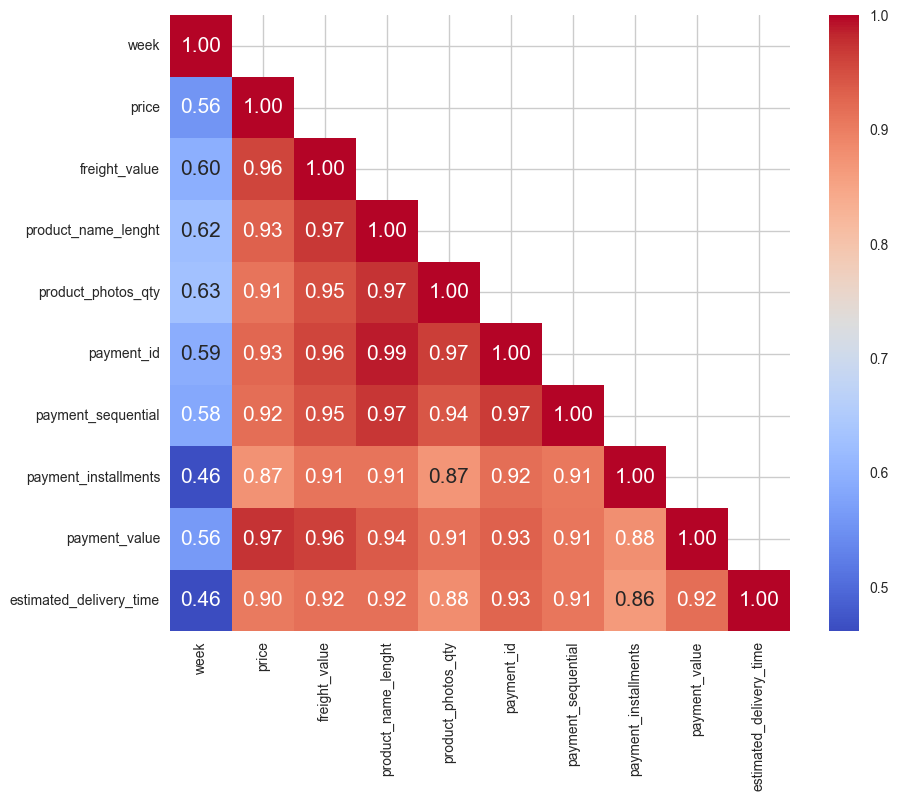

In [121]:
# Select only numeric columns
df_numeric = df_predicter.select_dtypes(include=[np.number])

# Calculate the correlation matrix
corr = df_numeric.corr()

# Create a DataFrame of zeros for non-numeric columns
non_numeric_cols = df_predicter.select_dtypes(exclude=[np.number]).columns

# Create a mask for the upper triangle
mask = np.ones_like(corr, dtype=bool)
mask[np.tril_indices_from(mask)] = False

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

In [38]:
X_train, X_test, y_train, y_test = train_test_split(
    df_predicter[[freq, 'price', 'freight_value', 'product_name_lenght', 'product_photos_qty', 'estimated_delivery_time']], # independent value
    df_predicter['payment_value'], # dependent value
     test_size=0.2, random_state=42, shuffle=False)

X, y = df_predicter[freq], df_predicter.payment_value

In [39]:
regr = LinearRegression()

# Fit the model to the training data
regr.fit(X_train, y_train)

# Use the model to make predictions on the testing data
y_pred = regr.predict(X_test)

In [40]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    name='Data Train',
    x = X_train[freq], 
    y = y_train,
    mode='markers+lines'
    ))

fig.add_trace(go.Scatter(
    name='Data Test',
    x = X_test[freq], 
    y = y_test,
    mode='lines'
    ))

fig.add_trace(go.Scatter(
    name="Linear Regression",
    x = X_test[freq],
    y = y_pred,
    mode='lines'
    ))

fig.update_layout(
    title= filter,
    xaxis_title=freq,
    yaxis_title='Sales [BRL]')

fig.show()

In [42]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    name='Data Test',
    x = X_test[freq], 
    y = y_test,
    mode='lines'
    ))

fig.add_trace(go.Scatter(
    name="Linear Regression",
    x = X_test[freq],
    y = y_pred,
    mode='lines'
    ))

fig.update_layout(
    title= (f'Predict {filter}'),
    xaxis_title= freq,
    yaxis_title='Sales [BRL]')

fig.show()

In [41]:
# Ploting Error for each prediction
fig = go.Figure()

fig.add_trace(go.Scatter(
    name="Error prediction",
    x = X_test[freq],
    y = y_test - y_pred,
    mode='lines'
    ))

fig.update_layout(
    title= (f'Prediction Error'),
    xaxis_title= freq)

fig.show()

In [117]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

table_data = [
    ['Mean Absolute Error', mae],
    ['Mean Squared Error', mse],
    ['R^2 Score', r2]
]

# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))

+---------------------+--------------------+
|       Metric        |       Value        |
+---------------------+--------------------+
| Mean Absolute Error | 1227.7160425607422 |
| Mean Squared Error  | 2112918.069650748  |
|      R^2 Score      | 0.9462496868472287 |
+---------------------+--------------------+
